In [1]:
#Preprocessing the image.


In [2]:
# 1.Inverted Image.
# 2.Rescalling Image.
# 3.Binarization of Image.
#   3.1 GrayScale Image
#   3.2 Thresholding Images.
#   3.3 Blur Image.
# 4.Noise Removal.
# 5.Dilation and Erosion.
# 6.Rotation /Deskewing.
# 7.Removing Borders.
# 8.Missing Borders.
# 9.Transparency / Alpha Channels.


0.0 Opening Image

In [2]:
import cv2 as cv#import open cv Library.
from matplotlib import  pyplot as plt
import pytesseract as py
image_files='images/rotatedfinal.jpg'
img = cv.imread(image_files)

In [3]:
# cv.imshow('original image',img)
# cv.waitKey(0)

In [4]:
# display(img)

In [5]:
def display(im_path):
    dpi = 80
    im_data = plt.imread(image_files)

    height, width  = im_data.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()
    # plot_image= plt.show()
    # cv2.imwrite('rotatedjpg',plot_image)   

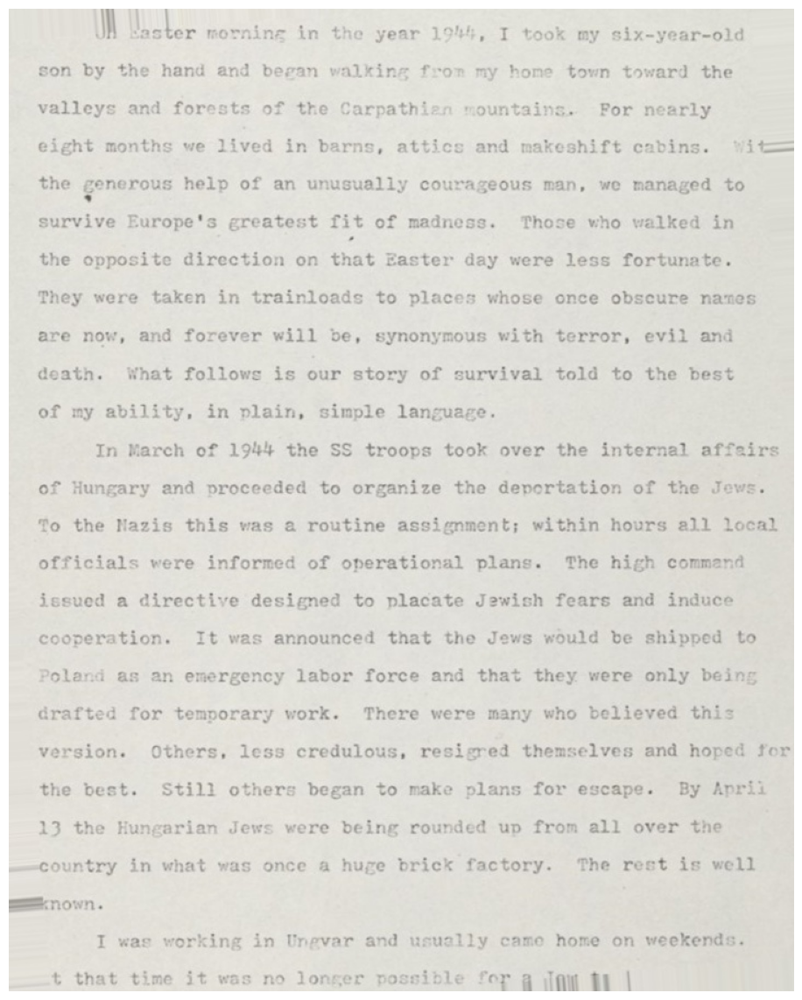

In [6]:
display(image_files)#Displaying the image using the matplotlib.

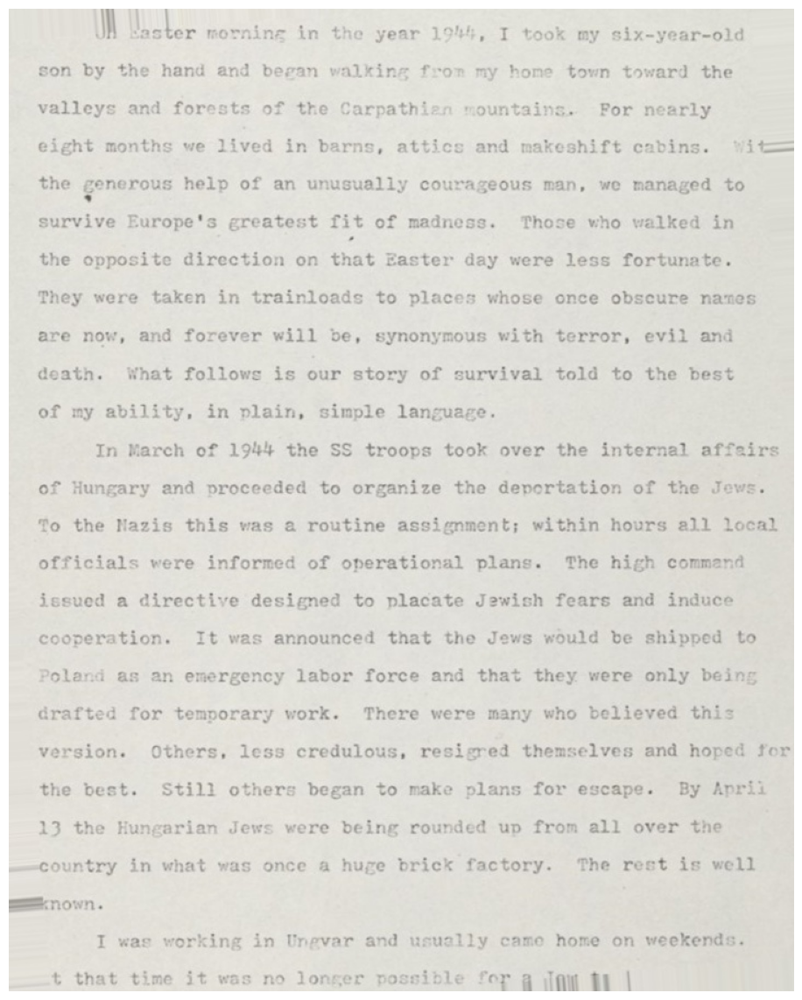

In [7]:
#1.Inverted Image.
inverted_image = cv.bitwise_not(img)
cv.imwrite('images/inverted_img1.jpg',inverted_image)
display('images/inverted_img1.jpg')

In [8]:
#02. Rescalling Image.


In [9]:
#Ploting the graph.


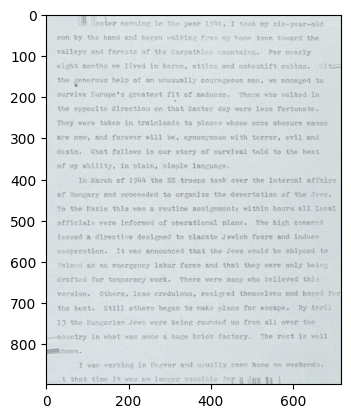

In [10]:
plt.imshow(img)

In [11]:
#03. Binarization 
   #O3.1 GrayScale  Image.

In [12]:
def grayscale(image):
    return cv.cvtColor(image,cv.COLOR_BGR2GRAY)


In [13]:
gray_image = grayscale(img)
cv.imwrite('images/gray_image.jpg',gray_image)

True

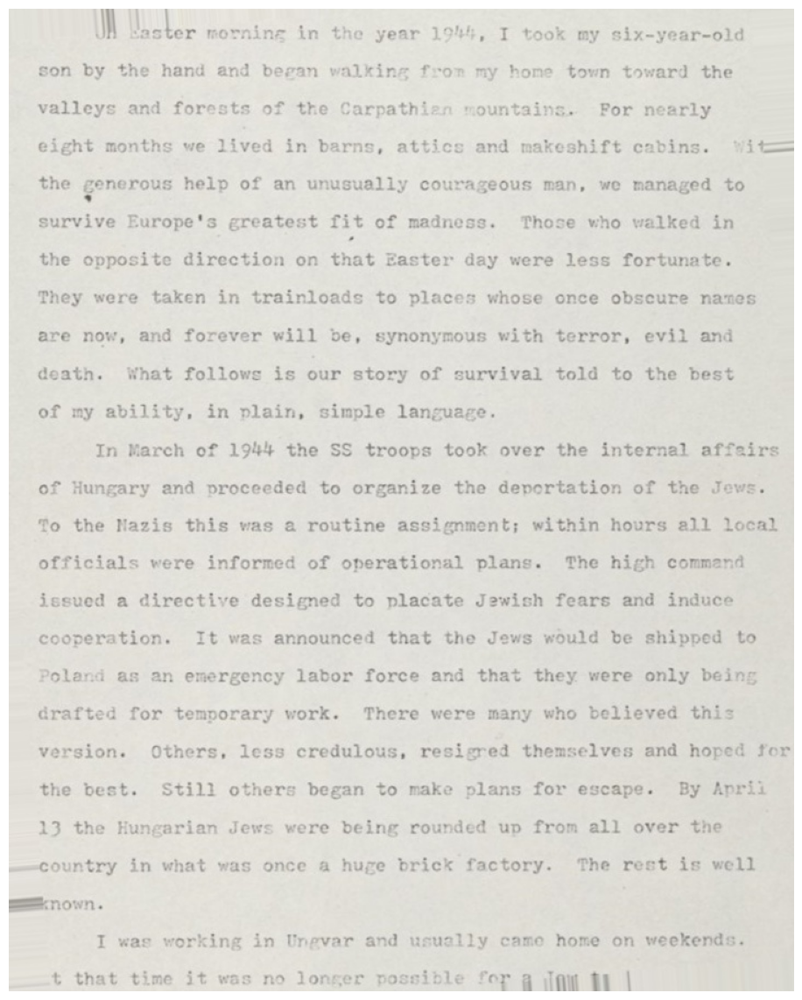

In [14]:
display('images/gray_image.jpg')

In [22]:
thresh ,im_bw = cv.threshold(gray_image ,230,250,cv.THRESH_BINARY)
cv.imwrite('threshold_img2.jpg',im_bw)

True

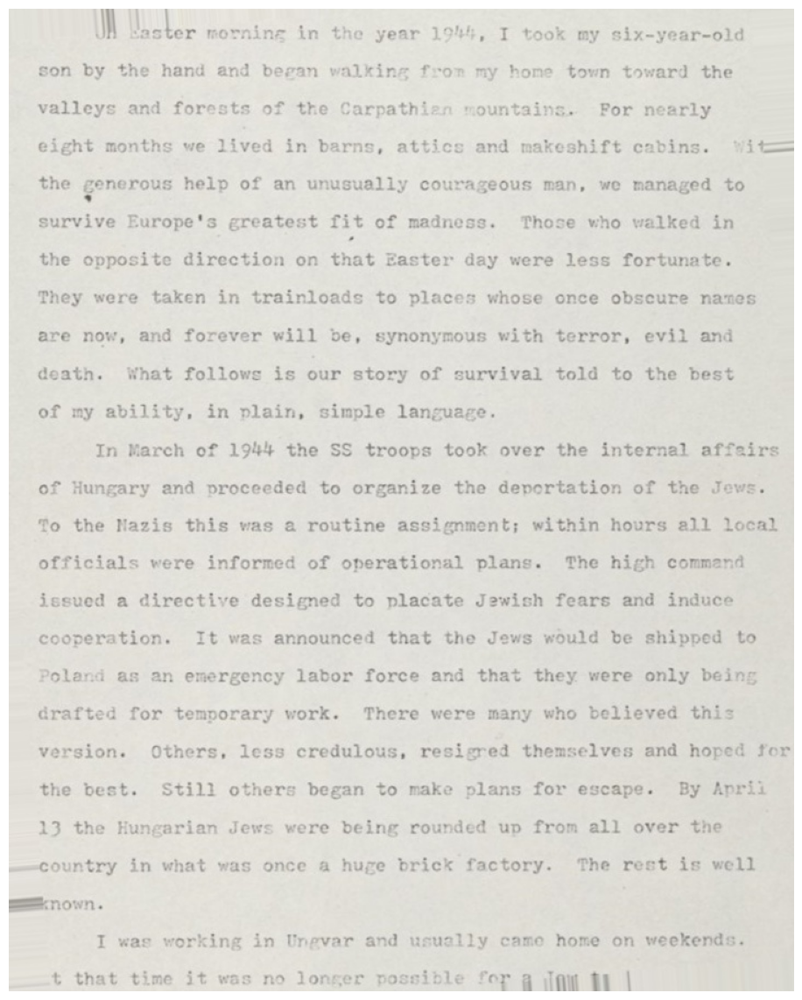

In [21]:
display('threshold_img2.jpg')

In [20]:
   #04 .Noise removal.
def noise_removal(image):
        import numpy as np
        kernel= np.ones((1,1),np.uint8)
        image = cv.dilate(image,kernel,iterations=1) 
        kernel =np.ones((1,1),np.uint8)
        image = cv.erode (image ,kernel,iterations=1)
        image = cv.morphologyEx(image,cv.MORPH_CLOSE,kernel)
        imGE = cv.medianBlur(image,3)
        return (image)

In [21]:
no_noise = noise_removal(im_bw)
cv.imwrite('images/noiseremoval_img.jpg',no_noise)

True

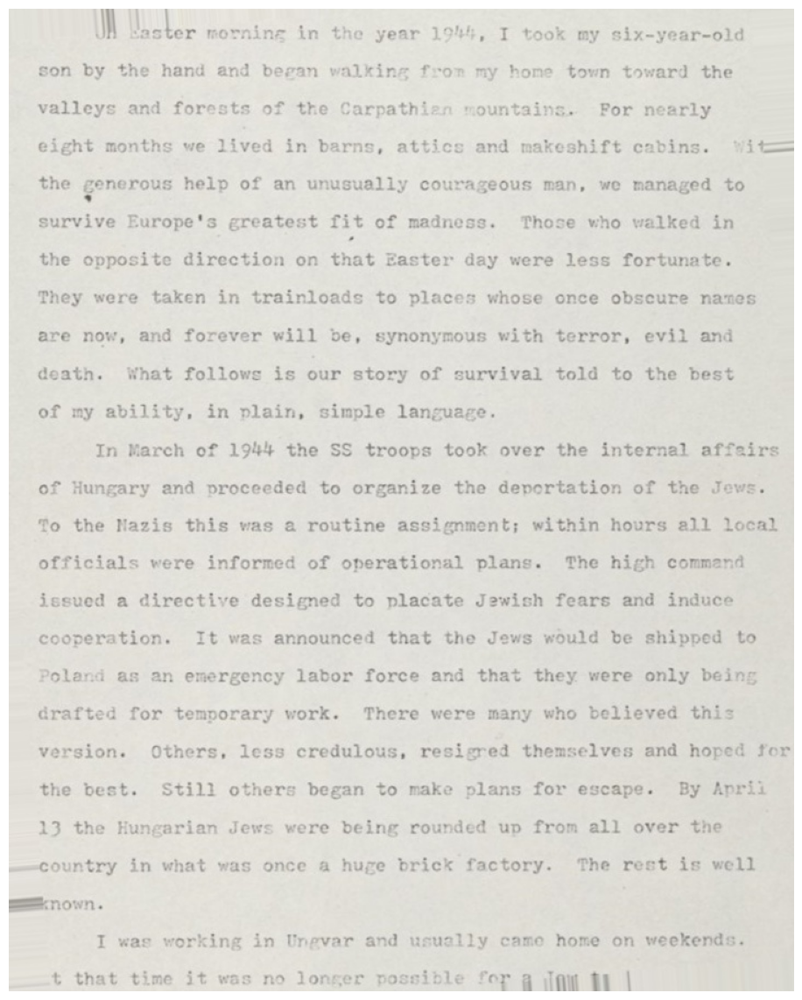

In [22]:
display('images/noiseremoval_img.jpg')

In [23]:
#05 Dilation and Errosion.

In [24]:
# def thin_font(image):
#     import numpy as np
#     image = cv.bitwise_not(image)
#     kernel = np.ones((3,3),np.uint8)
#     image = cv.erode(image, kernel, iterations=1)
#     image = cv.bitwise_not(image)
#     return (image)
def thick_font(image):
    import numpy as np
    image = cv.bitwise_not(image)
    kernel = np.ones((2,2),np.uint8)
    image = cv.dilate(image, kernel, iterations=1)
    image = cv.bitwise_not(image)
    return (image)

In [25]:
# eroded_image = thin_font(no_noise)
# cv.imwrite("images/dilation_img1.jpg", eroded_image)
dilated_image = thick_font(no_noise)
cv.imwrite("images/dilationthick_img1.jpg", dilated_image)

True

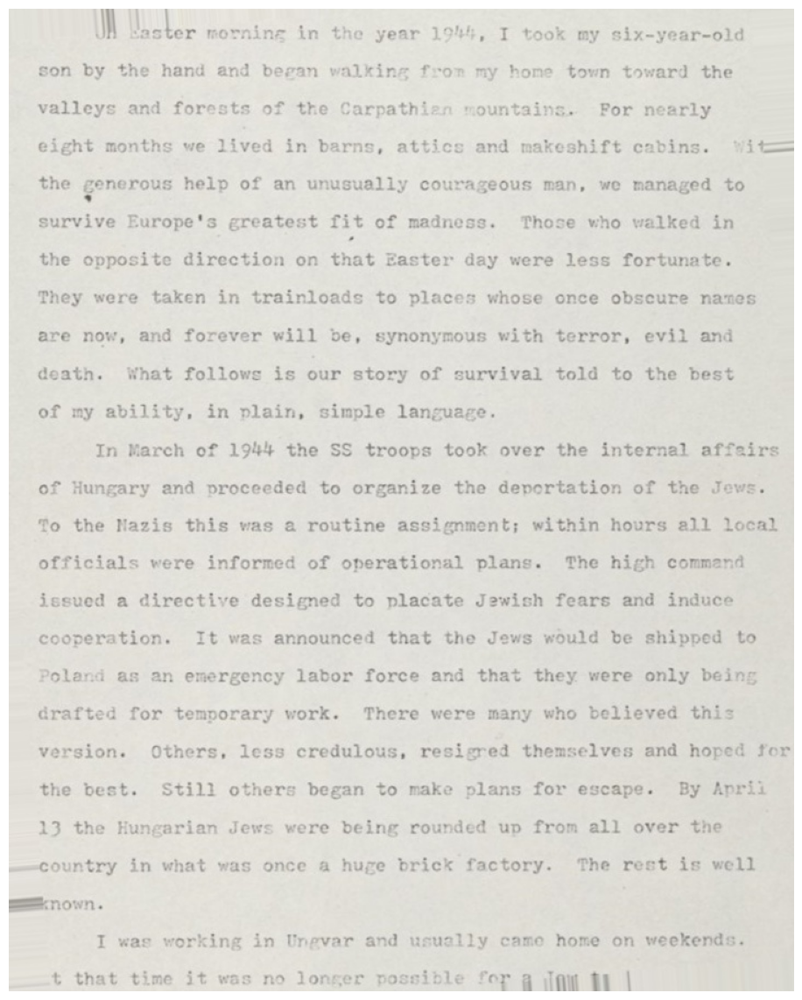

In [26]:
display("images/dilationthick_img1.jpg")

In [27]:
#06 Rotation / Deskewing.

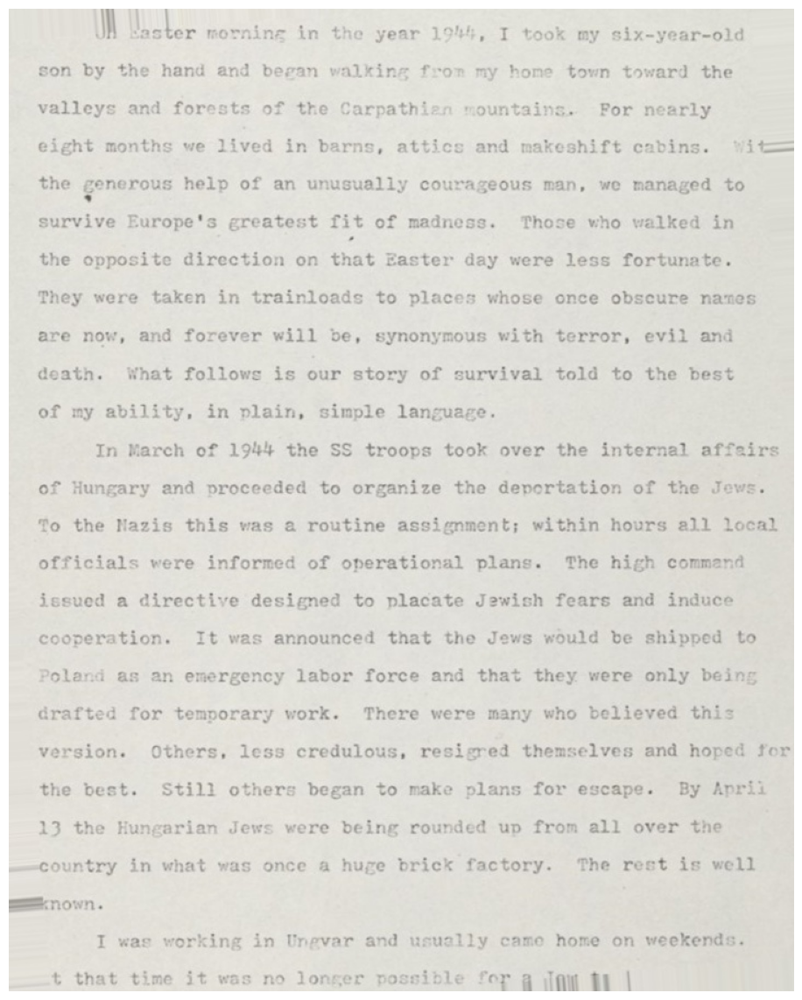

In [28]:
#OCR basically works with the vertically align the words .
new = cv.imread("images/scanned.jpg")
display("images/scannedd.jpg")

In [29]:
#https://becominghuman.ai/how-to-automatically-deskew-straighten-a-text-image-using-opencv-a0c30aed83df
import numpy as np

def getSkewAngle(cvImage) -> float:
    # Prep image, copy, convert to gray scale, blur, and threshold
    newImage = cvImage.copy()
    gray = cv.cvtColor(newImage, cv.COLOR_BGR2GRAY)
    blur = cv.GaussianBlur(gray, (9, 9), 0)
    thresh = cv.threshold(blur, 0, 255, cv.THRESH_BINARY_INV + cv.THRESH_OTSU)[1]

    # Apply dilate to merge text into meaningful lines/paragraphs.
    # Use larger kernel on X axis to merge characters into single line, cancelling out any spaces.
    # But use smaller kernel on Y axis to separate between different blocks of text
    kernel = cv.getStructuringElement(cv.MORPH_RECT, (30, 5))
    dilate = cv.dilate(thresh, kernel, iterations=2)

    # Find all contours
    contours, hierarchy = cv.findContours(dilate, cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key = cv.contourArea, reverse = True)
    for c in contours:
        rect = cv.boundingRect(c)
        x,y,w,h = rect
        cv.rectangle(newImage,(x,y),(x+w,y+h),(0,255,0),2)

    # Find largest contour and surround in min area box
    largestContour = contours[0]
    print (len(contours))
    minAreaRect = cv.minAreaRect(largestContour)
    cv.imwrite("images/scannedrotated_img.jpg", newImage)
    # Determine the angle. Convert it to the value that was originally used to obtain skewed image
    angle = minAreaRect[-1]
    if angle < -45:
        angle = 90+angle 
    return -1.0 * angle
# Rotate the image around its center
def rotateImage(cvImage, angle: float):
    newImage = cvImage.copy()
    (h, w) = newImage.shape[:2]
    center = (w // 2, h // 2)
    M = cv.getRotationMatrix2D(center, angle, 5.0)
    newImage = cv.warpAffine(newImage, M, (w, h), flags=cv.INTER_CUBIC, borderMode=cv.BORDER_REPLICATE)
    return newImage

In [30]:
# Deskew image
def deskew(cvImage):
    angle = getSkewAngle(cvImage)
    return rotateImage(cvImage, 5.0 * angle)


In [31]:
fixed = deskew(new)
cv.imwrite("images/scannedfinal.jpg", fixed)


1


True

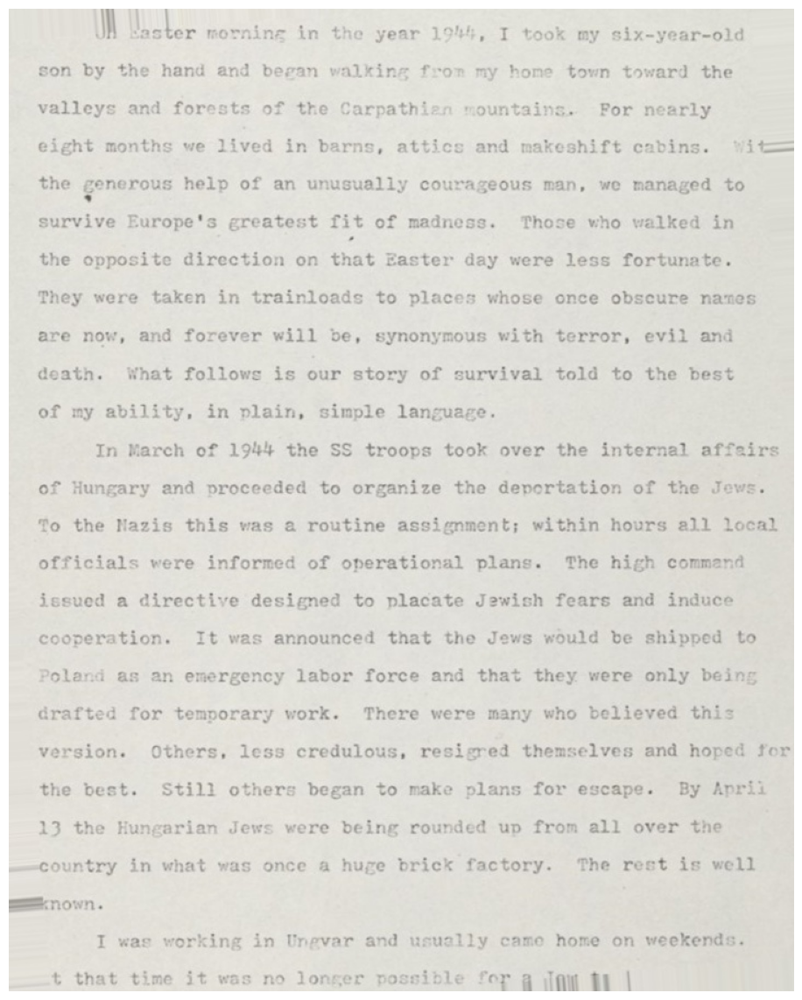

In [32]:
display("images/scannedfinal.jpg")

In [33]:
#07 Removing the borders.

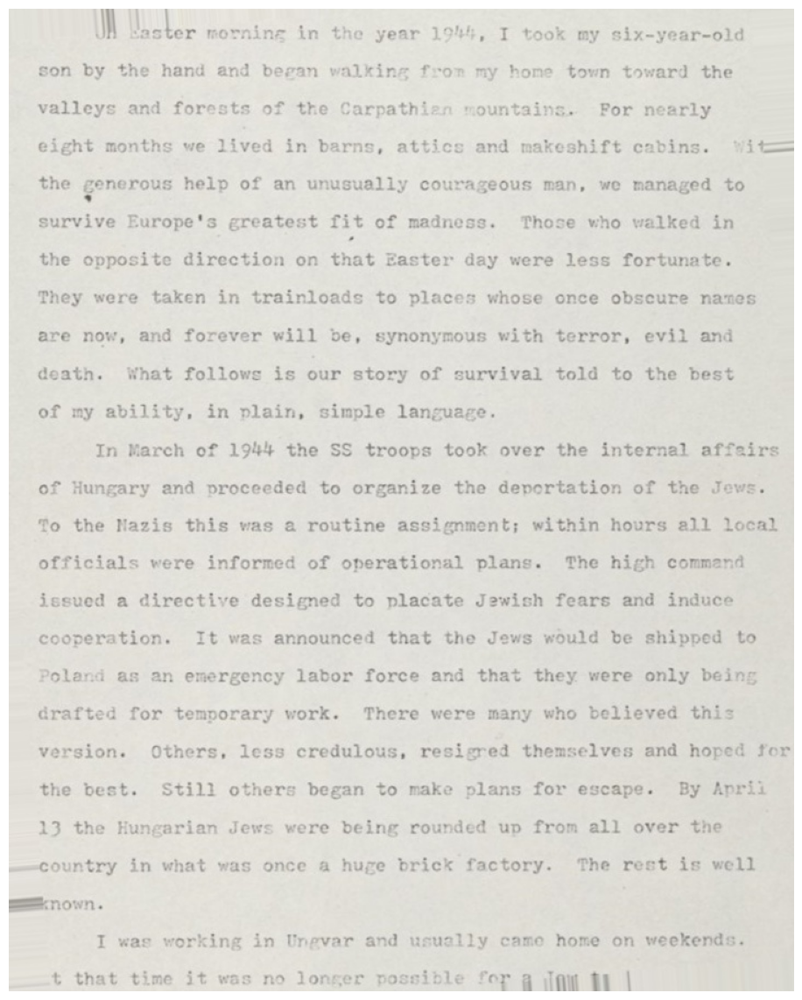

In [34]:
display('images/no_noise.jpg')

In [35]:
def remove_borders(image):
    contours, heiarchy = cv.findContours(image, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    cntsSorted = sorted(contours, key=lambda x:cv.contourArea(x))
    cnt = cntsSorted[-1]
    x, y, w, h = cv.boundingRect(cnt)
    crop = image[y:y+h, x:x+w]
    return (crop)

In [36]:
no_borders= remove_borders(no_noise)
cv.imwrite('images/no_borders.jpg',no_borders)


True

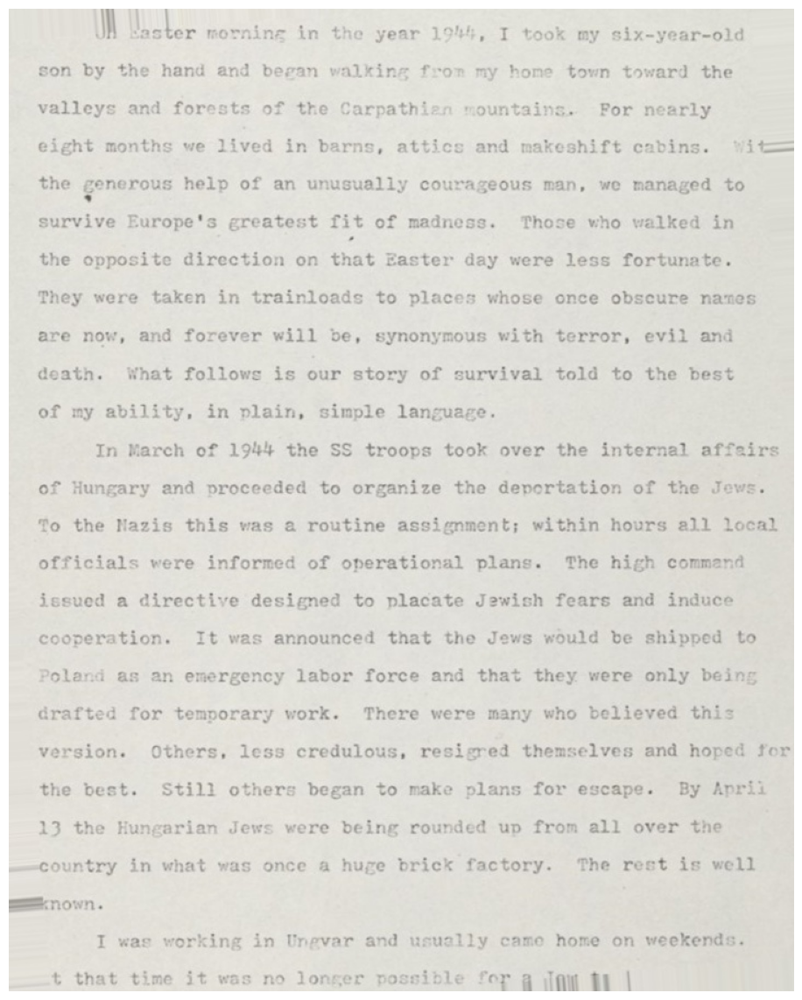

In [37]:
display('images/no_borders.jpg')

In [38]:
#08 Missing Borders

In [39]:
color = [300,255,255]
top,bottom,left,right =[150]*4

In [40]:
image_with_border = cv.copyMakeBorder(no_borders,top,bottom,left,right,cv.BORDER_CONSTANT,value = color)
cv.imwrite('images/image_with_border.jpg',image_with_border)

True

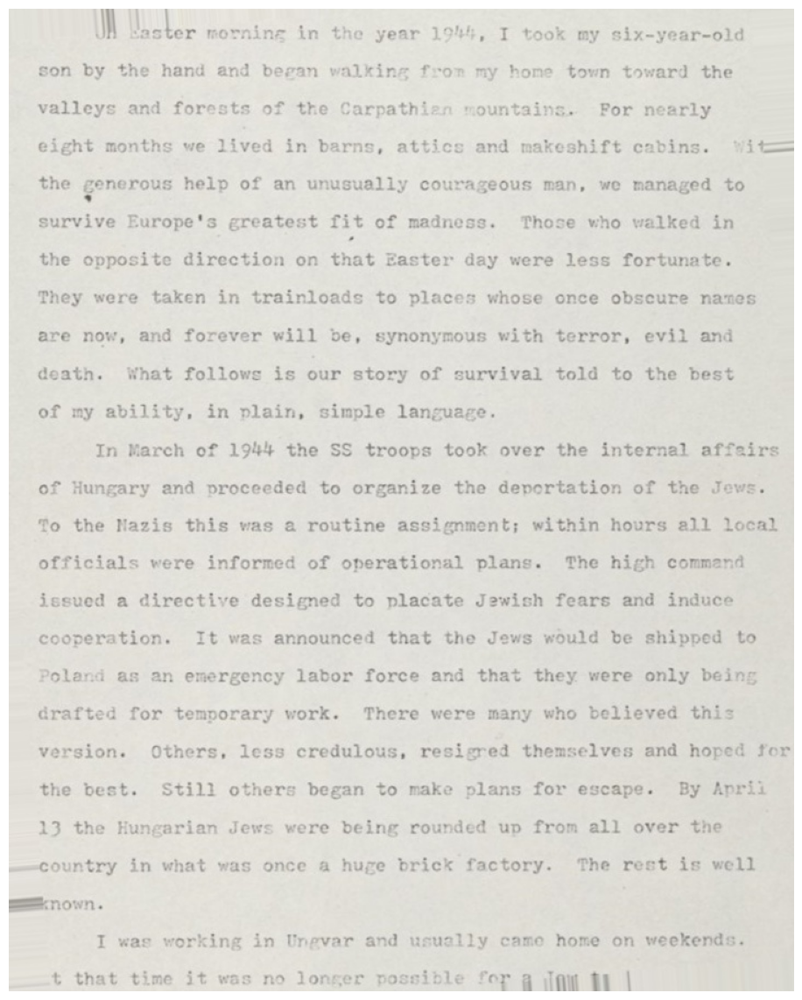

In [41]:
display('images/image_with_border.jpg')

In [42]:
result_image= pt.image_to_string('images/original.jpg')
print(result_image)

NameError: name 'pt' is not defined

In [ ]:
result_image= pt.image_to_string('images/rotatedfinal.jpg')
print(result_image)

In [ ]:
#After getting wrong answer from the first image .

In [ ]:
img = cv.imread('images/rotatedfinal.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

h, w, c = img.shape

if w > 1000:
    
    new_w = 1000
    ar = w/h
    new_h = int(new_w/ar)
    
    img = cv.resize(img, (new_w, new_h), interpolation = cv.INTER_AREA)
plt.imshow(img);

In [ ]:
def thresholding(image):
    img_gray = cv.cvtColor(image,cv.COLOR_BGR2GRAY)
    ret,thresh = cv.threshold(img_gray,200,255,cv.THRESH_BINARY_INV)
    #200 :- it means below 200 turn into black and remaining 255
    plt.imshow(thresh, cmap='gray')
    return thresh

thresh_img = thresholding(img);

In [ ]:
#dilation
kernel = np.ones((5,85), np.uint8)
dilated = cv.dilate(thresh_img, kernel, iterations = 1)
plt.imshow(dilated, cmap='gray');

In [ ]:
(contours, heirarchy) = cv.findContours(dilated.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)
sorted_contours_lines = sorted(contours, key = lambda ctr : cv.boundingRect(ctr)[1])

In [ ]:
img2 = img.copy()

for ctr in sorted_contours_lines:
    
    x,y,w,h = cv.boundingRect(ctr)
    cv.rectangle(img2, (x,y), (x+w, y+h), (40, 100, 250), 2)
    #(40,100,250) color name and 2 is width of box
    
plt.imshow(img2);

In [ ]:


#dilation
kernel = np.ones((3,15), np.uint8)
dilated2 = cv.dilate(thresh_img, kernel, iterations =1)
plt.imshow(dilated2, cmap='gray');



In [ ]:


img3 = img.copy()
words_list = []

for line in sorted_contours_lines:
    
    # roi of each lineA
    x, y, w, h = cv.boundingRect(line)
    roi_line = dilated2[y:y+w, x:x+w]
    
    # draw contours on each word
    (cnt, heirarchy) = cv.findContours(roi_line.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)
    sorted_contour_words = sorted(cnt, key=lambda cntr : cv.boundingRect(cntr)[1])
    
    for word in sorted_contour_words:
        
        if cv.contourArea(word) < 400:
            continue
        
        x2, y2, w2, h2 = cv.boundingRect(word)
        words_list.append([x+x2, y+y2, x+x2+w2, y+y2+h2])
        cv.rectangle(img3, (x+x2, y+y2), (x+x2+w2, y+y2+h2), (36,255,12),2)
        
plt.imshow(img3);



In [ ]:
ninth_word = words_list[3]
roi_9 = img[ninth_word[1]:ninth_word[3], ninth_word[0]:ninth_word[2]]
plt.imshow(roi_9);